In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("credit card.csv")
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [3]:
df.shape

(30000, 25)

In [4]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [5]:
df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [6]:
df = df.rename(columns={'default.payment.next.month':'payment'})

In [7]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [8]:
x = df.drop(['ID', 'payment'], axis=1)

In [9]:
y = df[['payment']]

In [10]:
y.value_counts()

payment
0          23364
1           6636
Name: count, dtype: int64

In [11]:
23364/ (23364+6636)

0.7788

In [12]:
#Wrapper Method-Recursive Feature Elimination (RFE) in Pypthon

In [13]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [14]:
classifier = LogisticRegression()

In [15]:
rfe = RFE(estimator=classifier, n_features_to_select=10)

In [16]:
#Fit RFE to Your Data

In [17]:
rfe.fit(x,y)

RFE(estimator=LogisticRegression(), n_features_to_select=10)

In [18]:
selected_features = rfe.support_
feature_ranks = rfe.ranking_

In [19]:
feature_ranks

array([ 8,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  9, 14, 10, 13,  7, 12,
        2,  3,  6,  4,  5, 11])

In [20]:
for feature, rank in zip(x.columns, feature_ranks):
    print(f'feature: {feature}, Rank: {rank}')
    

feature: LIMIT_BAL, Rank: 8
feature: SEX, Rank: 1
feature: EDUCATION, Rank: 1
feature: MARRIAGE, Rank: 1
feature: AGE, Rank: 1
feature: PAY_0, Rank: 1
feature: PAY_2, Rank: 1
feature: PAY_3, Rank: 1
feature: PAY_4, Rank: 1
feature: PAY_5, Rank: 1
feature: PAY_6, Rank: 1
feature: BILL_AMT1, Rank: 9
feature: BILL_AMT2, Rank: 14
feature: BILL_AMT3, Rank: 10
feature: BILL_AMT4, Rank: 13
feature: BILL_AMT5, Rank: 7
feature: BILL_AMT6, Rank: 12
feature: PAY_AMT1, Rank: 2
feature: PAY_AMT2, Rank: 3
feature: PAY_AMT3, Rank: 6
feature: PAY_AMT4, Rank: 4
feature: PAY_AMT5, Rank: 5
feature: PAY_AMT6, Rank: 11


In [21]:
#Based on Rank you Can Select Your Feature

Embedded Method-L1 Regularization(Lasso)

In [22]:
classifier = LogisticRegression(penalty='l1', solver='liblinear')

classifier.fit(x, y)

coefficients = classifier.coef_

In [23]:
for feature, coefficient in zip(x.columns, coefficients[0]):
    print(f'Feature: {feature}, Coefficient: {coefficient}')


Feature: LIMIT_BAL, Coefficient: -7.667002115303716e-07
Feature: SEX, Coefficient: -0.11021536363798735
Feature: EDUCATION, Coefficient: -0.10204978619242362
Feature: MARRIAGE, Coefficient: -0.1569726647758624
Feature: AGE, Coefficient: 0.007230976121200536
Feature: PAY_0, Coefficient: 0.5771195851644906
Feature: PAY_2, Coefficient: 0.08269577174064717
Feature: PAY_3, Coefficient: 0.07209688400543275
Feature: PAY_4, Coefficient: 0.023853251046453604
Feature: PAY_5, Coefficient: 0.03396016828937335
Feature: PAY_6, Coefficient: 0.008002402481356316
Feature: BILL_AMT1, Coefficient: -5.455910955947423e-06
Feature: BILL_AMT2, Coefficient: 2.290697600792498e-06
Feature: BILL_AMT3, Coefficient: 1.3998336191956843e-06
Feature: BILL_AMT4, Coefficient: -1.8857503911390697e-07
Feature: BILL_AMT5, Coefficient: 6.150766617720812e-07
Feature: BILL_AMT6, Coefficient: 3.9774807995746915e-07
Feature: PAY_AMT1, Coefficient: -1.3604749398840979e-05
Feature: PAY_AMT2, Coefficient: -9.653128488442747e-06
F

Filter Methods-Extra Tree Classifier

In [24]:
from sklearn.ensemble import ExtraTreesClassifier

In [25]:
extra = ExtraTreesClassifier()

In [26]:
extra.fit(x, y)

ExtraTreesClassifier()

In [27]:
extra.feature_importances_

array([0.06604084, 0.01288764, 0.0331841 , 0.02296052, 0.06642294,
       0.09260245, 0.05488186, 0.0325403 , 0.03290842, 0.02517112,
       0.02896405, 0.04997748, 0.04707288, 0.04498854, 0.04426686,
       0.04358732, 0.04417802, 0.04334466, 0.04238047, 0.04190367,
       0.04112687, 0.04255971, 0.04604929])

In [28]:
feature_importance = extra.feature_importances_
feature_importance 

array([0.06604084, 0.01288764, 0.0331841 , 0.02296052, 0.06642294,
       0.09260245, 0.05488186, 0.0325403 , 0.03290842, 0.02517112,
       0.02896405, 0.04997748, 0.04707288, 0.04498854, 0.04426686,
       0.04358732, 0.04417802, 0.04334466, 0.04238047, 0.04190367,
       0.04112687, 0.04255971, 0.04604929])

In [30]:
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp


,Gain_Score
0,0.066041
1,0.012888
2,0.033184
3,0.022961
4,0.066423
5,0.092602
6,0.054882
7,0.032540
8,0.032908
9,0.025171


In [31]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [32]:
cols = pd.DataFrame(x.columns, columns=['Feature_Names'])
cols

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [33]:
gains = pd.concat([cols, imp], axis=1)
gains

,Feature_Names,Gain_Score
0,LIMIT_BAL,0.066041
1,SEX,0.012888
2,EDUCATION,0.033184
3,MARRIAGE,0.022961
4,AGE,0.066423
5,PAY_0,0.092602
6,PAY_2,0.054882
7,PAY_3,0.032540
8,PAY_4,0.032908
9,PAY_5,0.025171


In [34]:
gains.nlargest(15, 'Gain_Score')

,Feature_Names,Gain_Score
5,PAY_0,0.092602
4,AGE,0.066423
0,LIMIT_BAL,0.066041
6,PAY_2,0.054882
11,BILL_AMT1,0.049977
12,BILL_AMT2,0.047073
22,PAY_AMT6,0.046049
13,BILL_AMT3,0.044989
14,BILL_AMT4,0.044267
16,BILL_AMT6,0.044178


In [35]:
gains.nsmallest(20, 'Gain_Score')

,Feature_Names,Gain_Score
1,SEX,0.012888
3,MARRIAGE,0.022961
9,PAY_5,0.025171
10,PAY_6,0.028964
7,PAY_3,0.032540
8,PAY_4,0.032908
2,EDUCATION,0.033184
20,PAY_AMT4,0.041127
19,PAY_AMT3,0.041904
18,PAY_AMT2,0.042380


<Axes: >

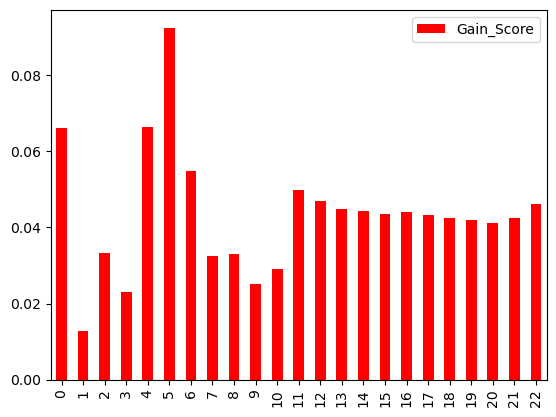

In [37]:
gains.plot(kind='bar', color=['red'])

In [38]:
x2 = x.copy()

In [39]:
x.shape

(30000, 23)

In [40]:
import matplotlib.pyplot as plt

<Axes: >

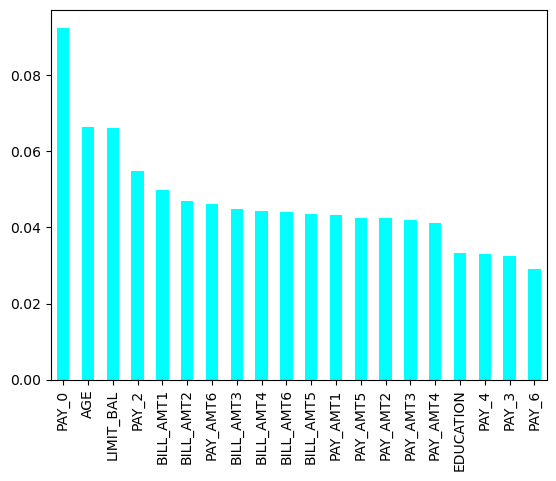

In [42]:
features = pd.Series(extra.feature_importances_, index= x.columns)
plt.Figure(figsize=(10, 6))
features.nlargest(20).plot(kind='bar', color= 'cyan')

In [43]:
import seaborn as sns

<Axes: >

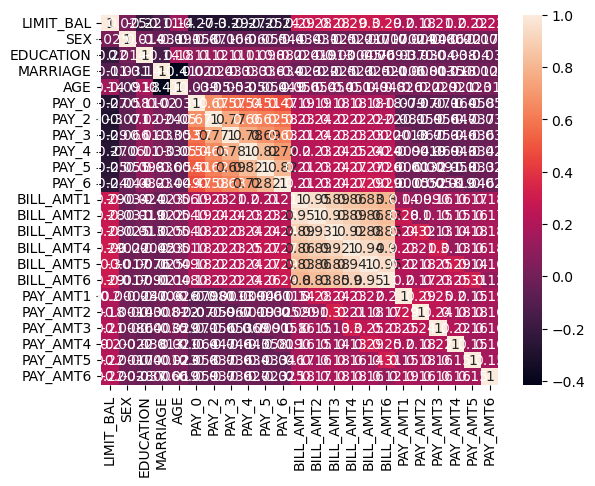

In [44]:
feature_names = x.columns
colname = x.corr().index
plt.Figure(figsize=(20, 20))
sns.heatmap(df[colname].corr(), annot=True)

Select K-Best

In [45]:
df = pd.read_csv('credit card.csv')
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID', 'payment'], axis=1)
y = df['payment']

In [46]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [47]:
y.head()

0    1
1    1
2    0
3    0
4    0
Name: payment, dtype: int64

In [50]:
from sklearn.feature_selection import SelectKBest, f_classif, f_regression

In [52]:
model2 = SelectKBest(score_func=f_classif)

In [53]:
feature_score = model2.fit(x, y)

In [55]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [56]:
cols = pd.DataFrame(feature_score.scores_, columns=['Feature_Scores'])
cols

,Feature_Scores
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [57]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [58]:
cols2 = pd.DataFrame(x.columns, columns=['Feature_Names'])
cols2.head()

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


In [60]:
scores = pd.concat([cols2, cols], axis=1)
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [61]:
scores.nlargest(15, 'Feature_Scores')

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [62]:
#Drop the Columns

In [64]:
#Save
#df.to_csv('new.csv')

PCA

In [65]:
import pandas as pd
df = pd.read_csv('credit card.csv')
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID', 'payment'], axis=1)
y = df['payment']

In [66]:
x

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [67]:
from sklearn.preprocessing import MinMaxScaler

In [68]:
mmx = MinMaxScaler() 

In [69]:
scaled_x = mmx.fit_transform(x)

In [70]:
scaled_x.shape

(30000, 23)

In [71]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

PCA

In [73]:
from sklearn.decomposition import PCA

In [74]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

In [75]:
x_pca

array([[-0.40423245, -0.00800476, -0.00259672],
       [-0.39188881,  0.209224  , -0.19698759],
       [-0.39264215,  0.08409527, -0.12656656],
       ...,
       [ 0.62351265,  0.33728837, -0.08489179],
       [ 0.60374479, -0.01953155,  0.214211  ],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [77]:
features = pd.DataFrame(x_pca, columns=['pca1', 'pca2', 'pca3'])

In [78]:
features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


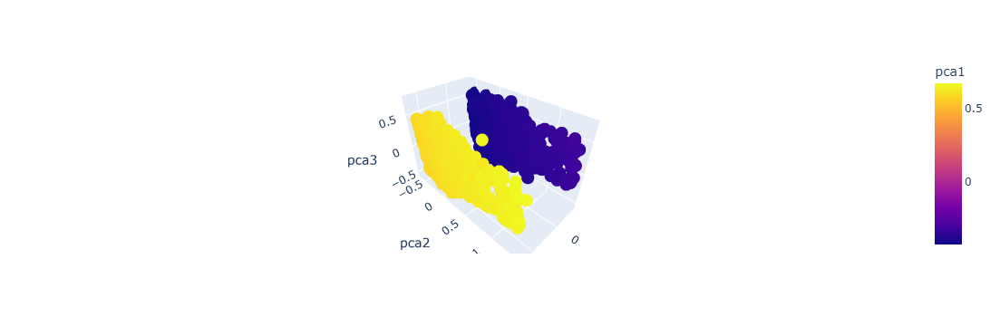

In [80]:
import plotly.express as pl
pl.scatter_3d(features, x='pca1', y='pca2', z='pca3', color='pca1')


In [81]:
from sklearn.model_selection import train_test_split as tts

In [82]:
xtrain, xtest, ytrain, ytest = tts(features,y, test_size=.30, random_state=1)

In [83]:
xtrain

,pca1,pca2,pca3
4936,0.588201,-0.220413,-0.321038
4788,0.616076,0.062374,0.319937
8447,-0.396698,0.103833,-0.210450
4535,0.588418,-0.368499,-0.139352
27563,0.619138,0.027233,0.115131
...,...,...,...
17289,-0.387321,0.169520,0.248251
5192,-0.413089,-0.415968,0.140726
12172,0.599752,0.071849,-0.267975
235,0.595272,-0.211586,-0.193925


In [84]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()

In [85]:
clf.fit(xtrain, ytrain)

LogisticRegression()

In [86]:
clf.score(xtest, ytest)

0.7962222222222223

In [87]:
clf.score(xtrain, ytrain)

0.7938571428571428

Before PCA

In [88]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [89]:
xtrain1, xtest2, ytrain1, ytest1 = tts(x,y, test_size=.30, random_state=1)

In [90]:
xtrain1.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
4936,20000.0,1,1,2,24,-1,-1,-1,-1,-1,...,390.0,780.0,0.0,0.0,390.0,390.0,780.0,0.0,0.0,0.0
4788,120000.0,1,2,1,52,2,0,0,0,0,...,105262.0,46605.0,45590.0,46204.0,4449.0,2731.0,3000.0,5000.0,3000.0,3000.0
8447,70000.0,2,2,2,26,0,0,0,0,0,...,26103.0,28342.0,24894.0,25272.0,3003.0,5106.0,4026.0,755.0,1029.0,5303.0
4535,230000.0,1,2,2,37,1,-2,-2,-2,-2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27563,130000.0,1,2,2,56,0,0,0,0,0,...,111780.0,116357.0,96936.0,98173.0,4000.0,5000.0,8000.0,4000.0,4000.0,5000.0


In [91]:
clf.fit(xtrain1, ytrain1)

LogisticRegression()

In [92]:
clf.score(xtest2, ytest1)

0.7777777777777778

In [95]:
clf.score(xtrain1, ytrain1)

0.7791904761904762